In [1]:
import pandas as pd
from surprise import Reader
from surprise import Dataset
from surprise.model_selection import cross_validate
from surprise import NormalPredictor
from surprise import KNNBasic
from surprise import KNNWithMeans
from surprise import KNNWithZScore
from surprise import KNNBaseline
from surprise import SVD
from surprise import BaselineOnly
from surprise import SVDpp
from surprise import NMF
from surprise import SlopeOne
from surprise import CoClustering
from surprise.accuracy import rmse
from surprise import accuracy
from surprise.model_selection import train_test_split

In [2]:
user=pd.read_csv('Data/BX-Users.csv', sep=';', error_bad_lines=False, encoding="latin-1")
user.columns=['userID','Location','Age']
rating=pd.read_csv('Data/BX-Book-Ratings.csv', sep=';', error_bad_lines=False, encoding="latin-1")
rating.columns=['userID','ISBN','bookRating']

In [3]:
user.head()

,userID,Location,Age
0,2,"stockton, california, usa",18
1,3,"moscow, yukon territory, russia",\N
2,4,"porto, v.n.gaia, portugal",17
3,5,"farnborough, hants, united kingdom",\N
4,6,"santa monica, california, usa",61


In [4]:
rating.head()

,userID,ISBN,bookRating
0,276726,0155061224,5
1,276727,0446520802,0
2,276729,052165615X,3
3,276729,0521795028,6
4,276733,2080674722,0


In [5]:
df=pd.merge(user,rating, on='userID',how='inner')
df.drop(['Location','Age'],axis=1, inplace=True)

In [6]:
df.head()

,userID,ISBN,bookRating
0,2,0195153448,0
1,7,034542252,0
2,8,0002005018,5
3,8,0060973129,0
4,8,0374157065,0


In [7]:
df.shape

(1149779, 3)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1149779 entries, 0 to 1149778
Data columns (total 3 columns):
userID        1149779 non-null int64
ISBN          1149779 non-null object
bookRating    1149779 non-null int64
dtypes: int64(2), object(1)
memory usage: 35.1+ MB


In [9]:
print('Dataset shape:{}'.format(df.shape))
print('-Dataset examples-')
print(df.iloc[::200000, :])

Dataset shape:(1149779, 3)
-Dataset examples-
         userID        ISBN  bookRating
0             2  0195153448           0
200000    48494  0871233428           0
400000    98391  0670032549          10
600000   147513  0470832525           5
800000   196502  0590431862           0
1000000  242157  0732275865           0


### EDA
### Ratings Distribution

In [10]:
from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

data = df['bookRating'].value_counts().sort_index(ascending=False)
trace = go.Bar(x = data.index,
               text = ['{:.1f} %'.format(val) for val in (data.values / df.shape[0] * 100)],
               textposition = 'auto',
               textfont = dict(color = '#000000'),
               y = data.values,
               )
# Create layout
layout = dict(title = 'Distribution Of {} book-ratings'.format(df.shape[0]),
              xaxis = dict(title = 'Rating'),
              yaxis = dict(title = 'Count'))
# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

we can see that over 62% of all ratings in the data are 0, and very few ratings are 1,or 2, or 3, low rating books mean they are generally really bad.

#### Ratings Distribution By Book

In [11]:
# number of ratings per book
data=df.groupby('ISBN')['bookRating'].count().clip(upper=50)

# create trace
trace=go.Histogram(x=data.values,
                  name='Ratings',
                  xbins=dict(start=0, end=50, size=2))

#create layout
layout=go.Layout(title='distribution of Number of Ratings Per Book (Clipped at 50)',
                xaxis=dict(title='Number of Ratings Per Book'),
                yaxis=dict(title='Count'),
                bargap=0.2)

#create plot
fig=go.Figure(data=[trace], layout=layout)
iplot(fig)

In [12]:
df.groupby('ISBN')['bookRating'].count().reset_index().sort_values('bookRating', ascending=False)[:10]

,ISBN,bookRating
247408,0971880107,2502
47371,0316666343,1295
83359,0385504209,883
9637,0060928336,732
41007,0312195516,723
101670,044023722X,647
166705,0679781587,639
28153,0142001740,615
166434,067976402X,614
153620,0671027360,586


Most of the books received lesx than 5 ratings, and very few books have many ratings, alothough the most rated book has received 2502 ratings.

### Ratings Distribution By User

In [13]:
# number of ratings per book
data=df.groupby('ISBN')['bookRating'].count().clip(upper=50)

# create trace
trace=go.Histogram(x=data.values,
                  name='Ratings',
                  xbins=dict(start=0, end=50, size=2))

#create layout
layout=go.Layout(title='distribution of Number of Ratings Per User (Clipped at 50)',
                xaxis=dict(title='Number of Ratings Per User'),
                yaxis=dict(title='Count'),
                bargap=0.2)

#create plot
fig=go.Figure(data=[trace], layout=layout)
iplot(fig)

In [14]:
df.groupby('userID')['bookRating'].count().reset_index().sort_values('bookRating', ascending=False)[:10]

,userID,bookRating
4213,11676,13602
74815,198711,7550
58113,153662,6109
37356,98391,5891
13576,35859,5850
80185,212898,4785
105110,278418,4533
28884,76352,3367
42037,110973,3100
88584,235105,3067


Most of the users gave less than 5 ratings, and very few users gave many ratings, althouhg the most productive user hve given 13602 ratings. To reduce the dimensionality of the dataset, we will filter out rarely rated movies and rarely rating users.

In [15]:
min_book_ratings=50
filter_books=df['ISBN'].value_counts() > min_book_ratings
filter_books=filter_books[filter_books].index.tolist()

min_user_ratings=50
filter_users=df['userID'].value_counts()> min_user_ratings
filter_users=filter_users[filter_users].index.tolist()

df_new=df[(df['ISBN'].isin(filter_books))&(df['userID'].isin(filter_users))]
print('The original data frame shape:\t{}'.format(df.shape))
print('The new data frame shape:\t{}'.format(df_new.shape))

The original data frame shape:	(1149779, 3)
The new data frame shape:	(140516, 3)


### Surprise

To load a dataset from a pandas dataframe, we will use the load_from_df() method, we will also need a Reader object, and the rating_scale parameter must be specified. The dataframe must have three columns, corresponding to the user ids, the item ids, and the ratings in this folder. Each row thus corresponds to a given rating.

In [16]:
reader=Reader(rating_scale=(0,9))
data=Dataset.load_from_df(df_new[['userID','ISBN','bookRating']], reader)

With the Surprise library, we will benchmark the following algorithms

### Basic algorithms
#### Normalpredictor
NormalPredictos algorithm predicts a random rating based on the distribution of the training set, which is assumed to be normal. This is one of the most basic algorithms thta do not do much work.
#### BaselineOnly
BaselineOnly algorithm predicts the baseline estimate for given user and item.
### k-NN algorithms
#### KNNBasic
KNNBasic is a basic collaborative filtering algorithm.
#### KNNWithMeans
KNNWithMeans is basic collaborative filtering algorithm, taking into account the mean ratings of each user.
#### KNNWithZScore
KNNWithZScore is a basic collaborative filtering algorithm, taking into account the z-score normalization of each user.
#### KNNBaseline
KNNBaseline is a basic collaborative filtering algorithm, taking into account a baseline rating.

In [17]:
benchmark = []
# Iterate over all algorithms
for algorithm in [SVD(), SVDpp(), SlopeOne(), NMF(), NormalPredictor(), KNNBaseline(), KNNBasic(), KNNWithMeans(), KNNWithZScore(), BaselineOnly(), CoClustering()]:
    # Perform cross validation
    results = cross_validate(algorithm, data, measures=['RMSE'], cv=3, verbose=False)
    
    # Get results & append algorithm name
    tmp = pd.DataFrame.from_dict(results).mean(axis=0)
    tmp = tmp.append(pd.Series([str(algorithm).split(' ')[0].split('.')[-1]], index=['Algorithm']))
    benchmark.append(tmp)

Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...


In [18]:
surprise_results=pd.DataFrame(benchmark).set_index('Algorithm').sort_values('test_rmse')

In [19]:
surprise_results

,fit_time,test_rmse,test_time
Algorithm,,,
BaselineOnly,0.369092,3.377068,0.668252
SlopeOne,0.985352,3.474312,4.964593
CoClustering,2.786976,3.478092,0.509653
KNNWithMeans,0.758561,3.486487,7.530407
KNNBaseline,0.996157,3.498465,9.067983
KNNWithZScore,0.961103,3.508566,8.006823
SVD,5.333185,3.548008,0.533789
KNNBasic,0.657848,3.721317,7.168967
SVDpp,109.021750,3.792215,5.666233


BaselineOnly algorithm gave us the best rmse, therefore, we will proceed further with BaselineOnly and use Alternating Least Squares (ALS).

In [20]:
print('Using ALS')
bsl_options={'method':'als',
            'n_epochs':5,
            'reg_u':12,
            'reg_i':5}
algo=BaselineOnly(bsl_options=bsl_options)
cross_validate(algo,data,measures=['RMSE'], cv=3, verbose=False)

Using ALS
Estimating biases using als...
Estimating biases using als...
Estimating biases using als...


{u'fit_time': (0.15899300575256348, 0.17281079292297363, 0.19227099418640137),
 u'test_rmse': array([3.40346669, 3.36880807, 3.35589203]),
 u'test_time': (0.5140390396118164, 0.5021698474884033, 0.5429091453552246)}

In [21]:
trainset, testset=train_test_split(data,test_size=0.25)
algo=BaselineOnly(bsl_options=bsl_options)
predictions=algo.fit(trainset).test(testset)
accuracy.rmse(predictions)

Estimating biases using als...
RMSE: 3.3597


3.3597402026967425

In [22]:
trainset=algo.trainset
print(algo.__class__.__name__)

BaselineOnly


To inspect our predictions in detials, we are going to build a pandas data frmae with all the predictions.

In [23]:
def get_Iu(uid):
    """ return the number of items rated by given user
    args: 
      uid: the id of the user
    returns: 
      the number of items rated by the user
    """
    try:
        return len(trainset.ur[trainset.to_inner_uid(uid)])
    except ValueError: # user was not part of the trainset
        return 0
    
def get_Ui(iid):
    """ return number of users that have rated given item
    args:
      iid: the raw id of the item
    returns:
      the number of users that have rated the item.
    """
    try: 
        return len(trainset.ir[trainset.to_inner_iid(iid)])
    except ValueError:
        return 0
    
df = pd.DataFrame(predictions, columns=['uid', 'iid', 'rui', 'est', 'details'])
df['Iu'] = df.uid.apply(get_Iu)
df['Ui'] = df.iid.apply(get_Ui)
df['err'] = abs(df.est - df.rui)

In [24]:
df.head()

,uid,iid,rui,est,details,Iu,Ui,err
0,39773,055328942X,0.0,1.290767,{u'was_impossible': False},48,36,1.290767
1,187256,0553576925,0.0,3.685733,{u'was_impossible': False},80,33,3.685733
2,8284,051512317X,0.0,1.845640,{u'was_impossible': False},20,58,1.845640
3,196457,0684835975,0.0,0.000000,{u'was_impossible': False},41,25,0.000000
4,2891,0515102652,0.0,2.251441,{u'was_impossible': False},33,32,2.251441


In [25]:
best_predictions=df.sort_values(by='err')[:10]
worst_predictions=df.sort_values(by='err')[-10:]

In [26]:
best_predictions

,uid,iid,rui,est,details,Iu,Ui,err
28996,102967,0425177173,0.0,0.0,{u'was_impossible': False},370,39,0.0
10055,170518,044011585X,0.0,0.0,{u'was_impossible': False},157,44,0.0
12229,127429,0515134368,0.0,0.0,{u'was_impossible': False},120,33,0.0
24811,225810,044023669X,0.0,0.0,{u'was_impossible': False},209,36,0.0
8071,198711,0743436210,0.0,0.0,{u'was_impossible': False},350,67,0.0
10669,278418,0425145638,0.0,0.0,{u'was_impossible': False},179,55,0.0
24808,228998,0345402308,0.0,0.0,{u'was_impossible': False},192,30,0.0
7539,3363,0425167720,0.0,0.0,{u'was_impossible': False},102,34,0.0
5856,102967,044021873X,0.0,0.0,{u'was_impossible': False},370,28,0.0
31174,212898,0345300203,0.0,0.0,{u'was_impossible': False},203,25,0.0


The above are the best predictions, and they are not lucky guesses. Because Ui is anywhere between 26 to 146, they are not really small, meaning that signigficant number of users have rated the target book.

In [27]:
worst_predictions

,uid,iid,rui,est,details,Iu,Ui,err
19672,73394,0345387651,10.0,0.210211,{u'was_impossible': False},237,118,9.789789
33997,207721,0452281903,10.0,0.073394,{u'was_impossible': False},55,46,9.926606
8654,263460,0440236851,10.0,0.058035,{u'was_impossible': False},60,46,9.941965
26723,182442,0679433740,10.0,0.000000,{u'was_impossible': False},42,30,10.000000
14059,260897,0374129983,10.0,0.000000,{u'was_impossible': False},121,42,10.000000
29618,161752,1551668912,10.0,0.000000,{u'was_impossible': False},64,34,10.000000
22368,156214,0446365505,10.0,0.000000,{u'was_impossible': False},39,56,10.000000
7722,14521,0553275976,10.0,0.000000,{u'was_impossible': False},170,88,10.000000
9864,26544,0515128600,10.0,0.000000,{u'was_impossible': False},188,38,10.000000
24672,91832,0440241537,10.0,0.000000,{u'was_impossible': False},90,75,10.000000


The worst predictions look pretty surprise. Let's look in more detials of the last one ISBN "055358264X", the book was rated by 47 users, user "26544" rated 10, out BaselineOnly algorithm predicts 0.

In [28]:
df_new.loc[df_new['ISBN']=='055358264X']['bookRating'].describe()

count    60.000000
mean      1.283333
std       2.969287
min       0.000000
25%       0.000000
50%       0.000000
75%       0.000000
max      10.000000
Name: bookRating, dtype: float64

<IPython.core.display.Javascript object>


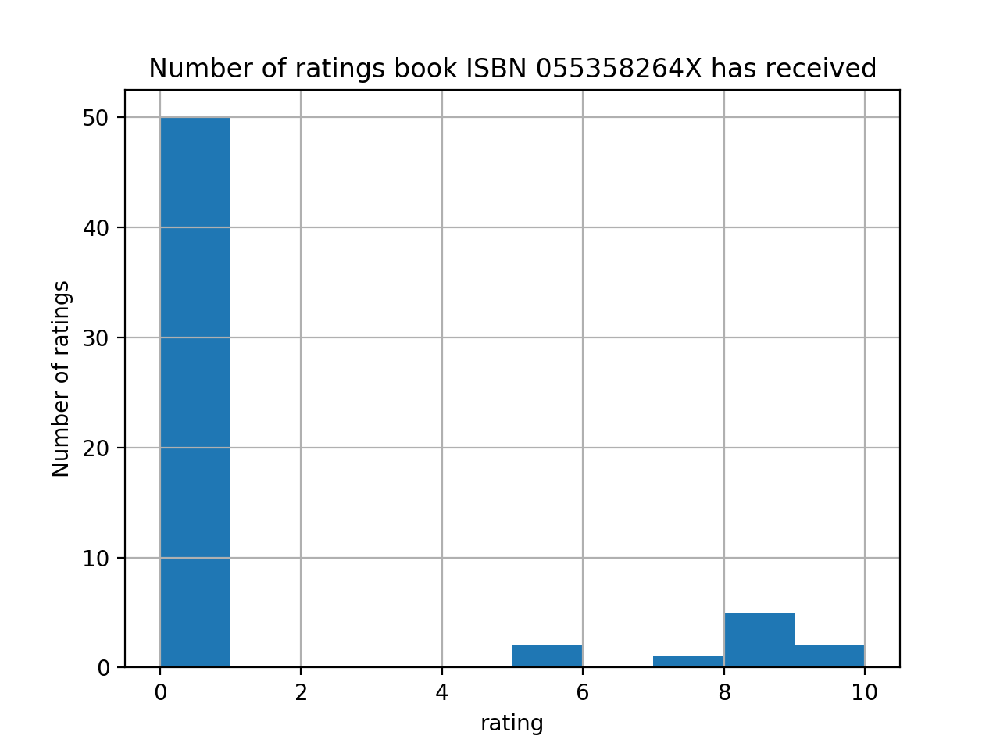

In [30]:
import matplotlib.pyplot as plt
%matplotlib notebook

df_new.loc[df_new['ISBN']=='055358264X']['bookRating'].hist()
plt.xlabel('rating')
plt.ylabel('Number of ratings')
plt.title('Number of ratings book ISBN 055358264X has received')
plt.show()

It turare smns out, most of the ratings this book received as "0", in another word, most of the users in the data rated this book "0", only very few users rated "10". Same with the other predictions in "worst predictions" list. It seems that for each prediction, the users are some kind of outsiders.